## Explore the Flora Danica dataset

Flora Danica dataset contains metadata in a xlsx file and more than 3000 tiff files.

In this notebook you can find scripts that can help you explore the dataset.

### Before you start

Before you start running this script on your own computer please notice that the script use following libraries which is not part of the standard packages.

You can install them from your notebook using pip install. Make a new cell and run the following:

!pip install matplotlib wikipedia plotly-express tqdm


## Import modules

In [1]:
## Import modules
from PIL import Image
from IPython.display import display
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import re
import requests
from bs4 import BeautifulSoup as bs
from tqdm import tqdm
# Initialize tqdm for pandas
tqdm.pandas()

## Display images

In [2]:
# Load an image from a file
image_path = r'floradanica_0001-0250/floradanica_0001.tif'  # Replace with your image file path
image = Image.open(image_path)

# Display the image inline in the Jupyter notebook
display(image)

FileNotFoundError: [Errno 2] No such file or directory: 'floradanica_0001-0250/floradanica_0001.tif'

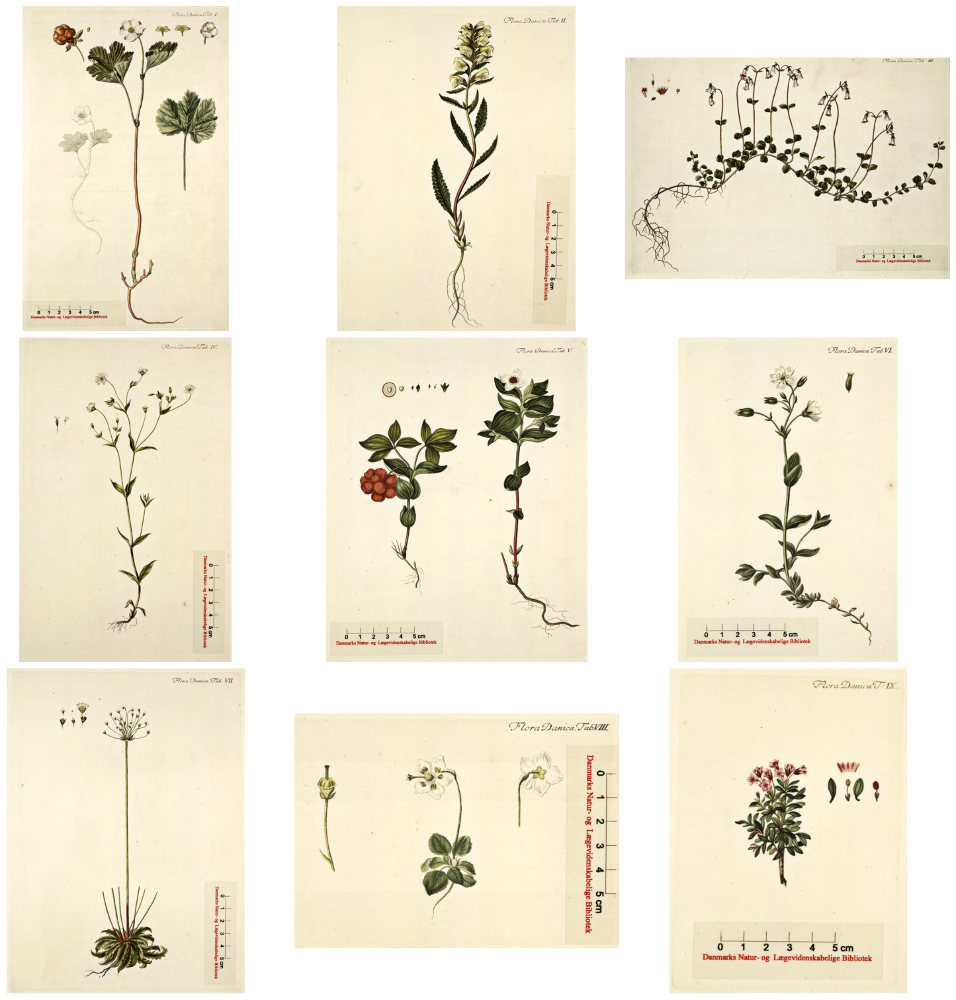

In [5]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Define the image directory and get the list of image files
image_dir = r'floradanica_0001-0250/'  # Replace with your image directory
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg', '.tif'))]

# Limit to the first 10 images (or fewer if there aren't that many)
image_files = image_files[:9]

# Create a list to hold the images
images = []

# Load the images
for image_file in image_files:
    image_path = os.path.join(image_dir, image_file)
    img = Image.open(image_path)
    images.append(img)

# Set up the grid for displaying images
num_images = len(images)
cols = 3  # Number of columns in the grid
rows = (num_images + cols - 1) // cols  # Calculate the number of rows needed

# Create a figure and axes for the grid
fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows), constrained_layout=True)

# Iterate through the images and display them
for ax, img in zip(axes.flatten(), images):
    ax.imshow(img)
    ax.axis('off')  # Hide axes ticks

# Hide any unused subplots (if num_images < rows * cols)
for ax in axes.flatten()[num_images:]:
    ax.axis('off')

# Show the grid of images
plt.show()

In [3]:
# read the Flora Danica metadata csv file
print ('Load data frame')
df = pd.read_excel(r'C:\Users\lakj\Documents\data\floradanica\Index_FloraDanica.xlsx')
print (f'Done. Dataframe shape: {df.shape}')
print ('Inspect the data frame.')


print ('First three rows')
df.head(3)

Load data frame
Done. Dataframe shape: (3240, 10)
Inspect the data frame.
First three rows


,Record Name,Titel,Opstilling,Lokalitet,Ophav,År,Note,Taxonomisk gruppe,Hæfte,Copyright
0,floradanica_0001.tif,Rubus Chamaemorus Linn.,Fol. Top. Bot. Danmark,Danmark\nNorge,"Hornemann, Jens Wilken (6.3.1770-30.7.1841) bo...",1761,"Flora Danica Hft. 1, Tab. 1\n\nFigur 1\nLatins...",Digitale Samlinger: Digitale Samlinger: Billed...,Digitale Samlinger: Billeder:Særudgivelser:Flo...,Materialet er fri af ophavsret
1,floradanica_0002.tif,Pedicularis lapponica L.,Fol. Top. Bot. Danmark,Danmark\nNorge,"Hornemann, Jens Wilken (6.3.1770-30.7.1841) bo...",1761,"Flora Danica Hft. 1, Tab. 2\n\nFigur 1\nLatins...",Digitale Samlinger: Digitale Samlinger: Billed...,Digitale Samlinger: Billeder:Særudgivelser:Flo...,Materialet er fri af ophavsret
2,floradanica_0003.tif,Linnaea borealis (Gronov.) L.,Fol. Top. Bot. Danmark,Danmark\nNorge,"Hornemann, Jens Wilken (6.3.1770-30.7.1841) bo...",1761,"Flora Danica Hft. 1, Tab. 3\n\nFigur 1\nLatins...",Digitale Samlinger: Digitale Samlinger: Billed...,Digitale Samlinger: Billeder:Særudgivelser:Flo...,Materialet er fri af ophavsret


## Column name: Taxonomisk gruppe

The values in the column is a bit messy. It holds both information about the name of the collection and information about the taxomatic group.

In [21]:
df.at[0, 'Taxonomisk gruppe']

'Digitale Samlinger: Digitale Samlinger: Billeder:Særudgivelser:Flora Danica:Taxonomisk gruppe:Karplanter'

### Extract the relevant information and add it to a new column

The actual information on taxonomy would be "Karplanter" while the rest is mess.

Let try to extract the relevant data and add it to a new column.



In [22]:
# access single value
S = df.at[0, 'Taxonomisk gruppe']
# split on ':' and take the last item of the list (the information that we need)
group_val = S.split(':')[-1]
group_val

'Karplanter'

Now build it into a function and apply the function to the extract the data and add it to a new column.

Immediately it looks like most of the plants belongs to the taxonomy group "Karplanter".

In [23]:
def get_taxonomy_data(S):
    group_val = S.split(':')[-1]
    return group_val


df['Taxonomic group_st'] = df['Taxonomisk gruppe'].apply(lambda x:get_taxonomy_data(x))
# Inspect the values of the new column
print (df['Taxonomic group_st'].value_counts())

Taxonomic group_st
Karplanter           2073
Svampe                391
Mosser                329
Alger                 228
Laver                 163
Slimsvampe             39
Ukendt                 15
Taxonomisk gruppe       1
Lave                    1
Name: count, dtype: int64


## Column name: Note
The dataset have also multiple values in other columns. For example in the column 'Note'.

Let take a closer look at the values in the first row of this column.

In [24]:
print (f'\nNote:\n{df.at[0,"Note"]}\n\n')


Note:
Flora Danica Hft. 1, Tab. 1

Figur 1
Latinsk navn: Rubus chamaemorus L.
Dansk slægtsnavn: Multebær
Dansk familienavn: Rosenfamilien
Latinsk familienavn: Rosaceae




In [25]:
print ('Parse data in "Note" column.')
# Function to parse relevant data
def parse_notes(note):
    # Initialize default values
    latinsk_familienavn = None
    latinsk_navn = None
    lange_nomenklator = None

    # Regular expression patterns to find the relevant data
    latinsk_familienavn_pattern = r'Latinsk familienavn:\s*(.*)'
    latinsk_navn_pattern = r'Latinsk navn:\s*(.*)'
    lange_nomenklator_pattern = r'Lange nomenklator:\s*(.*)'

    # Search for each relevant piece of information
    latinsk_familienavn_match = re.search(latinsk_familienavn_pattern, note)
    if latinsk_familienavn_match:
        latinsk_familienavn = latinsk_familienavn_match.group(1).strip()

    latinsk_navn_match = re.search(latinsk_navn_pattern, note)
    if latinsk_navn_match:
        latinsk_navn = latinsk_navn_match.group(1).strip()

    lange_nomenklator_match = re.search(lange_nomenklator_pattern, note)
    if lange_nomenklator_match:
        lange_nomenklator = lange_nomenklator_match.group(1).strip()

    # Combine Latinsk navn and Lange nomenklator
    combined_latinsk_navn = latinsk_navn if latinsk_navn != '-' else lange_nomenklator

    return latinsk_familienavn, combined_latinsk_navn

# Parse the DataFrame
parsed_data = df['Note'].progress_apply(parse_notes)
df_parsed = pd.DataFrame(parsed_data.tolist(), columns=['Latinsk familienavn', 'Latinsk navn'])
print ('Done')

# Concatenate data in "Note" column to data frame
print ('Concatenate data in "Note" column to data frame')
concat_df = pd.concat([df,df_parsed], axis=1)
print (f'Done. Dataframe shape {concat_df.shape}')

Parse data in "Note" column.


100%|██████████| 3240/3240 [00:00<00:00, 223185.55it/s]


Done
Concatenate data in "Note" column to data frame
Done. Dataframe shape (3240, 13)


In [27]:
df

,Record Name,Titel,Opstilling,Lokalitet,Ophav,År,Note,Taxonomisk gruppe,Hæfte,Copyright,Taxonomic group_st
0,floradanica_0001.tif,Rubus Chamaemorus Linn.,Fol. Top. Bot. Danmark,Danmark\nNorge,"Hornemann, Jens Wilken (6.3.1770-30.7.1841) bo...",1761,"Flora Danica Hft. 1, Tab. 1\n\nFigur 1\nLatins...",Digitale Samlinger: Digitale Samlinger: Billed...,Digitale Samlinger: Billeder:Særudgivelser:Flo...,Materialet er fri af ophavsret,Karplanter
1,floradanica_0002.tif,Pedicularis lapponica L.,Fol. Top. Bot. Danmark,Danmark\nNorge,"Hornemann, Jens Wilken (6.3.1770-30.7.1841) bo...",1761,"Flora Danica Hft. 1, Tab. 2\n\nFigur 1\nLatins...",Digitale Samlinger: Digitale Samlinger: Billed...,Digitale Samlinger: Billeder:Særudgivelser:Flo...,Materialet er fri af ophavsret,Karplanter
2,floradanica_0003.tif,Linnaea borealis (Gronov.) L.,Fol. Top. Bot. Danmark,Danmark\nNorge,"Hornemann, Jens Wilken (6.3.1770-30.7.1841) bo...",1761,"Flora Danica Hft. 1, Tab. 3\n\nFigur 1\nLatins...",Digitale Samlinger: Digitale Samlinger: Billed...,Digitale Samlinger: Billeder:Særudgivelser:Flo...,Materialet er fri af ophavsret,Karplanter
3,floradanica_0004.tif,Silene rupestris L.,Fol. Top. Bot. Danmark,Danmark\nNorge,"Hornemann, Jens Wilken (6.3.1770-30.7.1841) bo...",1761,"Flora Danica Hft. 1, Tab. 4\n\nFigur 1\nLatins...",Digitale Samlinger: Digitale Samlinger: Billed...,Digitale Samlinger: Billeder:Særudgivelser:Flo...,Materialet er fri af ophavsret,Karplanter
4,floradanica_0005.tif,Cornus suecica L.,Fol. Top. Bot. Danmark,Danmark\nNorge,"Hornemann, Jens Wilken (6.3.1770-30.7.1841) bo...",1761,"Flora Danica Hft. 1, Tab. 5\n\nFigur 1\nLatins...",Digitale Samlinger: Digitale Samlinger: Billed...,Digitale Samlinger: Billeder:Særudgivelser:Flo...,Materialet er fri af ophavsret,Karplanter
...,...,...,...,...,...,...,...,...,...,...,...
3235,floradanica_S0176.tif,Salix Amandae And. (S. glauca var. pullata Fr.),Fol. Top. Bot. Danmark,Danmark\nNorge,"Hornemann, Jens Wilken (6.3.1770-30.7.1841) bo...",1874,"Flora Danica Suppl. 3, Tab. 176\n\nFigur 1\nLa...",Digitale Samlinger: Billeder:Særudgivelser:Flo...,Digitale Samlinger: Billeder:Særudgivelser:Flo...,Materialet er fri af ophavsret,Karplanter
3236,floradanica_S0177.tif,Asplenium marinum L.,Fol. Top. Bot. Danmark,Danmark\nNorge,"Hornemann, Jens Wilken (6.3.1770-30.7.1841) bo...",1874,"Flora Danica Suppl. 3, Tab. 177\n\nFigur 1\nLa...",Digitale Samlinger: Billeder:Særudgivelser:Flo...,Digitale Samlinger: Billeder:Særudgivelser:Flo...,Materialet er fri af ophavsret,Karplanter
3237,floradanica_S0178.tif,Asplenium Breynii Retz. (A. germanicum Weis.),Fol. Top. Bot. Danmark,Danmark\nNorge,"Hornemann, Jens Wilken (6.3.1770-30.7.1841) bo...",1874,"Flora Danica Suppl. 3, Tab. 178\n\nFigur 1\nLa...",Digitale Samlinger: Billeder:Særudgivelser:Flo...,Digitale Samlinger: Billeder:Særudgivelser:Flo...,Materialet er fri af ophavsret,Karplanter
3238,floradanica_S0179.tif,Jungermannia laxifolia Hook.,Fol. Top. Bot. Danmark,Danmark\nNorge,"Hornemann, Jens Wilken (6.3.1770-30.7.1841) bo...",1874,"Flora Danica Suppl. 3, Tab. 179\n\nFigur 1\nLa...",Digitale Samlinger: Billeder:Særudgivelser:Flo...,Digitale Samlinger: Billeder:Særudgivelser:Flo...,Materialet er fri af ophavsret,Mosser


## Visualisations

In [26]:
taxonomy_data_in = df['Taxonomic group_st'].value_counts().to_frame().reset_index()
taxonomy_data_in = taxonomy_data_in.query('count > 15')

# Create a tree diagram using Plotly
fig = px.bar(taxonomy_data_in,x='Taxonomic group_st', y='count',
             color_discrete_sequence=["#ea7600"],
                 title='Plant Groups')


# Update layout for better readability
fig.update_layout(
    xaxis_title='Taxonomic group',
    yaxis_title='Count',
    xaxis_tickangle=-45,  # Rotate x-axis labels for better readability
    yaxis=dict(showgrid=True, gridcolor="#45d6d3", gridwidth=0.5),  # Add gridlines
    plot_bgcolor='white'  # Set the background color to white
)

fig.show()

In [13]:
###
print ('Make a subset of the data frame.')
# We have to many columns now. To make it more easy to work in the data we filter the data frame selecting only some of the columns.
df_subset = concat_df[['Record Name', 'Latinsk navn', 'Latinsk familienavn']]
print (f'Keep columns: {df_subset.columns}')
print (f'Subset dataframe shape: {df_subset.shape}')

Make a subset of the data frame.
Keep columns: Index(['Record Name', 'Latinsk navn', 'Latinsk familienavn'], dtype='object')
Subset dataframe shape: (3240, 3)


In [14]:
print ('Prepare data for vislauisation; group data by "Latinsk familienavn" and count the values in "Latinsk navn"')
count_df = df_subset.groupby('Latinsk familienavn')['Latinsk navn'].value_counts().to_frame()\
                        .query('count >= 1').reset_index()

# Create a tree diagram using Plotly
fig = px.treemap(count_df, path=['Latinsk familienavn', 'Latinsk navn'], values='count',
                 color_discrete_sequence=["#45d6d3", "#2224ba", "#ee138c", "#ea7600", "#13dbb7"],
                 title='Tree Visualization of Plant Families and Species')

# Show the figure
fig.show()

Prepare data for vislauisation; group data by "Latinsk familienavn" and count the values in "Latinsk navn"


In [15]:
print('Count the values in column "Latinsk familienavn".')

family_names_value_count = count_df['Latinsk familienavn'].value_counts().reset_index()

print ('Select the first 25 rows for visualisation.')
plot_df = family_names_value_count.head(25).copy()

# Create a bar plot using Plotly Express
fig = px.bar(plot_df, 
             x='Latinsk familienavn', 
             y='count', 
             title='Count of Different Plant Families',
             labels={'Latinsk familienavn': 'Latinsk Familienavn', 'count': 'Count'},
             color_discrete_sequence=['#ee138c'])

# Update layout for better readability
fig.update_layout(
    xaxis_title='Latinsk Familienavn',
    yaxis_title='Count',
    xaxis_tickangle=-45,  # Rotate x-axis labels for better readability
    yaxis=dict(showgrid=True, gridcolor="#45d6d3", gridwidth=0.5),  # Add gridlines
    plot_bgcolor='white'  # Set the background color to white
)

# Show the plot
fig.show()

Count the values in column "Latinsk familienavn".
Select the first 25 rows for visualisation.


## Enrichment

We do not have much text to describe the plants in the dataset. Many of the plants might be described on Wikipidia. Let scrape text data from Wikipedia and add that to our dataset. Firstly we have to prepare the data and we do it by using the values in the column "Latinsk navn" to build urls that we can use to scrape the text data from Wikipedia. Secondly we can start downloading the text data.

In [16]:
print ('Prepare data for data enrichment')

print ('Drop na values from "Latinsk navn"')
print (f'Dataframe shape before {df_subset.shape}')
df_subset_enrich = df_subset.dropna(subset='Latinsk navn')
print (f'Dataframe shape after : {df_subset_enrich.shape}')

Prepare data for data enrichment
Drop na values from "Latinsk navn"
Dataframe shape before (3240, 3)
Dataframe shape after : (3009, 3)


In [17]:
print ('Make wikipedia urls out of values in "Latinsk navn."')
species_list = list(df_subset_enrich['Latinsk navn'].to_list())

def extract_names(plant_names):
    extracted = []
    
    for name in plant_names:
        # Split the name by spaces
        parts = name.split()
        
        if len(parts) < 2:
            # If there are less than two words, just return the name
            extracted.append(parts[0])
            continue
        
        first_word = parts[1]  # The second word (index 1)
        
        if first_word.endswith('.'):
            # If the second word ends with a period, return only the first word
            extracted.append(parts[0])  # Return the first word (index 0)
        elif '-' in first_word:
            # If the second word contains a dash, return the first and second words
            extracted.append(f"{parts[0]} {first_word}")
        else:
            # Otherwise, return the first and second words
            extracted.append(f"{parts[0]} {first_word}")
    
    return extracted

# Extract names based on the rules
extracted_names = extract_names(species_list)


# function to clean extracted names 
def scrub_species(i):
    return i.replace('(', '').replace(')', '').replace('?', '').replace('!', '').replace(' ', '_')

clean_species_list = [scrub_species(i) for i in extracted_names]

wiki_urls = ['https://en.wikipedia.org/wiki/' + i for i in clean_species_list]

# Use .loc to avoid SettingWithCopyWarning
df_subset_enrich.loc[:, 'wiki_urls'] = wiki_urls

print ('Done. Wikipedia urls are build, and the data frame ready to be used to download data from Wikipedia.')



# Function to get Wikipedia content
def get_wiki_content(url):
    headers = {"User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64; rv:133.0) Gecko/20100101 Firefox/133.0"}
    response = requests.get(url, headers=headers)
    soup = bs(response.text, 'html.parser')
    all_text_tags = soup.find_all(['h1', 'h2', 'h3', 'p'])
    all_text = [i.text for i in all_text_tags]
    all_text = ' '.join(all_text)
    return all_text


print ('Downloading data.')
# Apply the function with tqdm progress bar
df_subset_enrich['wiki_info'] = df_subset_enrich['wiki_urls'].progress_apply(get_wiki_content)
print ('Done downloading data.')
df_subset_enrich.to_csv(r'.\out\names_family_names_wiki_urls.csv', index='False')
print ('Dataframe is stored in "out" folder.')

Make wikipedia urls out of values in "Latinsk navn."


C:\Users\lakj\AppData\Local\Temp\ipykernel_18352\3043364328.py:43: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Done. Wikipedia urls are build, and the data frame ready to be used to download data from Wikipedia.


100%|██████████| 3009/3009 [23:13<00:00,  2.16it/s]
C:\Users\lakj\AppData\Local\Temp\ipykernel_18352\3043364328.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Done downloading data.
Dataframe is stored in "out" folder.


In [18]:
df_subset_enrich

,Record Name,Latinsk navn,Latinsk familienavn,wiki_urls,wiki_info
0,floradanica_0001.tif,Rubus chamaemorus L.,Rosaceae,https://en.wikipedia.org/wiki/Rubus_chamaemorus,Contents Rubus chamaemorus \n Rubus chamaemoru...
1,floradanica_0002.tif,Pedicularis lapponica L.,Scrophulariaceae,https://en.wikipedia.org/wiki/Pedicularis_lapp...,Contents Pedicularis lapponica \n Pedicularis ...
2,floradanica_0003.tif,Linnaea borealis L. ssp. borealis,Caprifoliaceae,https://en.wikipedia.org/wiki/Linnaea_borealis,Contents Linnaea \n Linnaea borealis is a spec...
3,floradanica_0004.tif,Silene rupestris L.,Caryophyllaceae,https://en.wikipedia.org/wiki/Silene_rupestris,"Contents Atocion rupestre \n Atocion rupestre,..."
4,floradanica_0005.tif,Cornus suecica L.,Cornaceae,https://en.wikipedia.org/wiki/Cornus_suecica,"Contents Cornus suecica \n Cornus suecica, the..."
...,...,...,...,...,...
3233,floradanica_S0174.tif,Salix sp.,Salicaceae,https://en.wikipedia.org/wiki/Salix,"Contents Willow \n Willows, also called sallow..."
3234,floradanica_S0175.tif,Salix sp.,Salicaceae,https://en.wikipedia.org/wiki/Salix,"Contents Willow \n Willows, also called sallow..."
3235,floradanica_S0176.tif,Salix sp.,Salicaceae,https://en.wikipedia.org/wiki/Salix,"Contents Willow \n Willows, also called sallow..."
3236,floradanica_S0177.tif,Asplenium marinum L.,Aspleniaceae,https://en.wikipedia.org/wiki/Asplenium_marinum,Contents Asplenium marinum \n Asplenium marinu...
